<a href="https://colab.research.google.com/github/faisal-ali472/Deep-Learning/blob/master/keras_CNN_visualization_01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# https://keras.io/
!pip install -q keras
import keras

'''Visualization of the filters of VGG16, via gradient ascent in input space.
This script can run on CPU in a few minutes.
Results example: http://i.imgur.com/4nj4KjN.jpg
'''
from __future__ import print_function

from scipy.misc import imsave, imshow
import numpy as np
import time
from keras.applications import vgg16
from keras import backend as K


In [0]:

# dimensions of the generated pictures for each filter.
img_width = 128
img_height = 128

# the name of the layer we want to visualize
# (see model definition at keras/applications/vgg16.py)
layer_name = 'block5_conv3'
scan_filters_count = 200

# util function to convert a tensor into a valid image


def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + K.epsilon())
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    if K.image_data_format() == 'channels_first':
        x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# build the VGG16 network with ImageNet weights
model = vgg16.VGG16(weights='imagenet', include_top=False)
print('Model loaded.')

model.summary()

# this is the placeholder for the input images
input_img = model.input

# get the symbolic outputs of each "key" layer (we gave them unique names).
layer_dict = dict([(layer.name, layer) for layer in model.layers[1:]])


def normalize(x):
    # utility function to normalize a tensor by its L2 norm
    return x / (K.sqrt(K.mean(K.square(x))) + K.epsilon())


kept_filters = []
for filter_index in range(scan_filters_count):
    # we only scan through the first 'scan_filters_count' filters,
    
    print('Processing filter %d' % filter_index)
    start_time = time.time()

    # we build a loss function that maximizes the activation
    # of the nth filter of the layer considered
    layer_output = layer_dict[layer_name].output
    if K.image_data_format() == 'channels_first':
        loss = K.mean(layer_output[:, filter_index, :, :])
    else:
        loss = K.mean(layer_output[:, :, :, filter_index])

    # we compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, input_img)[0]

    # normalization trick: we normalize the gradient
    grads = normalize(grads)

    # this function returns the loss and grads given the input picture
    iterate = K.function([input_img], [loss, grads])

    # step size for gradient ascent
    step = 1.

    # we start from a gray image with some random noise
    if K.image_data_format() == 'channels_first':
        input_img_data = np.random.random((1, 3, img_width, img_height))
    else:
        input_img_data = np.random.random((1, img_width, img_height, 3))
    input_img_data = (input_img_data - 0.5) * 20 + 128

    # we run gradient ascent for 20 steps
    for i in range(50):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

        print('Current loss value:', loss_value)
        if loss_value <= 0.:
            # some filters get stuck to 0, we can skip them
            break

    # decode the resulting input image
    if loss_value > 0:
        img = deprocess_image(input_img_data[0])
        kept_filters.append((img, loss_value))
    end_time = time.time()
    print('Filter %d processed in %ds' % (filter_index, end_time - start_time))


Model loaded.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0      

Current loss value: 0.0
Filter 17 processed in 0s
Processing filter 18
Current loss value: 0.0
Filter 18 processed in 0s
Processing filter 19
Current loss value: 0.0061082123
Current loss value: 2.1963954
Current loss value: 9.829572
Current loss value: 17.642673
Current loss value: 30.220444
Current loss value: 41.454697
Current loss value: 49.99588
Current loss value: 66.54601
Current loss value: 82.91259
Current loss value: 99.47369
Current loss value: 109.45776
Current loss value: 126.41295
Current loss value: 140.0392
Current loss value: 148.39807
Current loss value: 164.37233
Current loss value: 173.88005
Current loss value: 186.67065
Current loss value: 199.53818
Current loss value: 210.15376
Current loss value: 217.2937
Current loss value: 224.79459
Current loss value: 237.59702
Current loss value: 250.91208
Current loss value: 259.0877
Current loss value: 272.51178
Current loss value: 280.2339
Current loss value: 288.7553
Current loss value: 300.93604
Current loss value: 309.3

Current loss value: 145.23746
Current loss value: 153.27551
Current loss value: 159.56987
Current loss value: 169.42561
Current loss value: 175.944
Current loss value: 182.08324
Current loss value: 188.33672
Current loss value: 195.71161
Current loss value: 201.40005
Current loss value: 208.0915
Current loss value: 216.30963
Current loss value: 220.85397
Current loss value: 228.73367
Current loss value: 233.00558
Current loss value: 240.86105
Current loss value: 246.06815
Current loss value: 252.39343
Current loss value: 259.83142
Current loss value: 265.74838
Current loss value: 273.4842
Current loss value: 279.08447
Current loss value: 287.60663
Current loss value: 294.43896
Current loss value: 302.06497
Current loss value: 306.8181
Current loss value: 315.57147
Current loss value: 320.83694
Current loss value: 330.1899
Current loss value: 336.2829
Current loss value: 344.23584
Current loss value: 351.2009
Current loss value: 359.89618
Current loss value: 365.56897
Filter 42 processe

Current loss value: 0.07106449
Current loss value: 3.7124753
Current loss value: 10.793973
Current loss value: 20.735918
Current loss value: 31.775175
Current loss value: 45.53665
Current loss value: 65.3456
Current loss value: 72.393906
Current loss value: 79.462906
Current loss value: 92.00249
Current loss value: 100.373665
Current loss value: 110.23521
Current loss value: 118.08597
Current loss value: 123.45195
Current loss value: 134.54099
Current loss value: 146.23563
Current loss value: 155.72989
Current loss value: 162.72491
Current loss value: 173.65842
Current loss value: 184.69104
Current loss value: 191.47284
Current loss value: 202.72038
Current loss value: 209.76807
Current loss value: 220.67342
Current loss value: 227.95908
Current loss value: 240.288
Current loss value: 243.8035
Current loss value: 257.2091
Current loss value: 263.61096
Current loss value: 275.84705
Current loss value: 284.87457
Current loss value: 295.68628
Current loss value: 305.46228
Current loss val

Current loss value: 505.4925
Current loss value: 514.71106
Filter 58 processed in 2s
Processing filter 59
Current loss value: 0.0
Filter 59 processed in 0s
Processing filter 60
Current loss value: 0.0
Filter 60 processed in 0s
Processing filter 61
Current loss value: 0.0
Filter 61 processed in 0s
Processing filter 62
Current loss value: 0.0
Filter 62 processed in 0s
Processing filter 63
Current loss value: 0.0
Filter 63 processed in 0s
Processing filter 64
Current loss value: 0.0
Filter 64 processed in 0s
Processing filter 65
Current loss value: 0.0
Filter 65 processed in 0s
Processing filter 66
Current loss value: 0.0
Filter 66 processed in 1s
Processing filter 67
Current loss value: 0.0
Filter 67 processed in 0s
Processing filter 68
Current loss value: 0.0
Filter 68 processed in 0s
Processing filter 69
Current loss value: 0.0
Filter 69 processed in 0s
Processing filter 70
Current loss value: 0.0
Filter 70 processed in 0s
Processing filter 71
Current loss value: 0.0
Filter 71 processe

Current loss value: 0.0
Filter 96 processed in 1s
Processing filter 97
Current loss value: 0.0
Filter 97 processed in 1s
Processing filter 98
Current loss value: 0.0
Filter 98 processed in 1s
Processing filter 99
Current loss value: 0.0
Filter 99 processed in 1s
Processing filter 100
Current loss value: 0.0
Filter 100 processed in 1s
Processing filter 101
Current loss value: 0.0
Filter 101 processed in 1s
Processing filter 102
Current loss value: 0.0
Filter 102 processed in 1s
Processing filter 103
Current loss value: 0.026357839
Current loss value: 0.64001614
Current loss value: 11.46537
Current loss value: 27.409311
Current loss value: 41.698326
Current loss value: 52.293594
Current loss value: 66.9214
Current loss value: 81.436714
Current loss value: 95.38158
Current loss value: 105.3422
Current loss value: 120.06919
Current loss value: 132.43095
Current loss value: 148.89413
Current loss value: 157.93228
Current loss value: 172.43317
Current loss value: 184.55211
Current loss value

Current loss value: 195.19954
Current loss value: 201.72505
Current loss value: 207.52977
Current loss value: 213.37245
Current loss value: 219.03415
Current loss value: 226.01813
Current loss value: 229.9537
Current loss value: 236.07411
Current loss value: 241.77298
Current loss value: 247.01819
Current loss value: 254.69873
Current loss value: 258.74896
Current loss value: 265.99146
Current loss value: 271.30096
Current loss value: 276.26776
Current loss value: 283.9409
Current loss value: 287.60745
Current loss value: 294.37277
Current loss value: 299.18988
Current loss value: 303.71115
Current loss value: 309.95978
Current loss value: 315.83575
Current loss value: 321.06134
Current loss value: 327.90198
Current loss value: 333.17462
Current loss value: 338.77957
Filter 119 processed in 2s
Processing filter 120
Current loss value: 0.0
Filter 120 processed in 1s
Processing filter 121
Current loss value: 0.0
Filter 121 processed in 1s
Processing filter 122
Current loss value: 0.0
Fil

Current loss value: 0.0
Filter 130 processed in 1s
Processing filter 131
Current loss value: 0.0
Filter 131 processed in 1s
Processing filter 132
Current loss value: 0.0
Filter 132 processed in 1s
Processing filter 133
Current loss value: 0.0
Filter 133 processed in 1s
Processing filter 134
Current loss value: 0.0
Filter 134 processed in 1s
Processing filter 135
Current loss value: 0.0
Filter 135 processed in 1s
Processing filter 136
Current loss value: 0.0
Filter 136 processed in 1s
Processing filter 137
Current loss value: 0.0
Filter 137 processed in 1s
Processing filter 138
Current loss value: 0.0
Filter 138 processed in 1s
Processing filter 139
Current loss value: 0.0
Filter 139 processed in 1s
Processing filter 140
Current loss value: 0.0
Filter 140 processed in 1s
Processing filter 141
Current loss value: 0.0
Filter 141 processed in 1s
Processing filter 142
Current loss value: 0.0
Filter 142 processed in 1s
Processing filter 143
Current loss value: 0.68231833
Current loss value: 

Current loss value: 112.04468
Current loss value: 114.031784
Current loss value: 120.961205
Current loss value: 121.3167
Current loss value: 130.5703
Current loss value: 134.1427
Current loss value: 138.59348
Current loss value: 141.86264
Current loss value: 148.75142
Current loss value: 150.54727
Current loss value: 157.96625
Current loss value: 160.75555
Current loss value: 166.89319
Current loss value: 169.7888
Current loss value: 175.92099
Current loss value: 177.94049
Current loss value: 184.72432
Current loss value: 188.75049
Current loss value: 193.90027
Current loss value: 197.89864
Current loss value: 204.34497
Current loss value: 207.70818
Current loss value: 213.71039
Current loss value: 218.70166
Current loss value: 224.42899
Current loss value: 228.73032
Filter 155 processed in 2s
Processing filter 156
Current loss value: 0.0
Filter 156 processed in 1s
Processing filter 157
Current loss value: 0.0
Filter 157 processed in 1s
Processing filter 158
Current loss value: 0.0
Fil

Current loss value: 409.695
Current loss value: 420.2068
Current loss value: 432.85156
Current loss value: 444.08862
Current loss value: 456.80664
Current loss value: 467.1731
Current loss value: 479.87976
Current loss value: 487.48022
Current loss value: 501.96405
Current loss value: 511.23157
Current loss value: 527.34265
Current loss value: 536.9142
Current loss value: 550.84564
Current loss value: 562.447
Current loss value: 575.5399
Current loss value: 587.848
Current loss value: 601.25244
Current loss value: 613.77374
Current loss value: 627.6415
Current loss value: 638.9884
Filter 172 processed in 2s
Processing filter 173
Current loss value: 0.0
Filter 173 processed in 1s
Processing filter 174
Current loss value: 0.0
Filter 174 processed in 1s
Processing filter 175
Current loss value: 0.0
Filter 175 processed in 1s
Processing filter 176
Current loss value: 0.0
Filter 176 processed in 1s
Processing filter 177
Current loss value: 0.0
Filter 177 processed in 1s
Processing filter 17

Current loss value: 623.9092
Filter 185 processed in 2s
Processing filter 186
Current loss value: 0.0
Filter 186 processed in 1s
Processing filter 187
Current loss value: 0.0
Filter 187 processed in 1s
Processing filter 188
Current loss value: 0.0
Filter 188 processed in 1s
Processing filter 189
Current loss value: 0.0
Filter 189 processed in 1s
Processing filter 190
Current loss value: 0.0
Filter 190 processed in 1s
Processing filter 191
Current loss value: 0.0
Filter 191 processed in 1s
Processing filter 192
Current loss value: 0.0
Filter 192 processed in 1s
Processing filter 193
Current loss value: 0.0
Filter 193 processed in 1s
Processing filter 194
Current loss value: 0.0
Filter 194 processed in 1s
Processing filter 195
Current loss value: 0.0
Filter 195 processed in 1s
Processing filter 196
Current loss value: 0.0
Filter 196 processed in 1s
Processing filter 197
Current loss value: 0.0
Filter 197 processed in 1s
Processing filter 198
Current loss value: 0.0
Filter 198 processed i

In [0]:
len(kept_filters)

16

In [0]:

# we will stich the best 64 filters on a 8 x 8 grid.
n = 4

# the filters that have the highest loss are assumed to be better-looking.
# we will only keep the top 64 filters.
kept_filters.sort(key=lambda x: x[1], reverse=True)
kept_filters = kept_filters[:n * n]

# build a black picture with enough space for
# our 8 x 8 filters of size 128 x 128, with a 5px margin in between
margin = 5
width = n * img_width + (n - 1) * margin
height = n * img_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

# fill the picture with our saved filters
for i in range(n):
    for j in range(n):
        img, loss = kept_filters[i * n + j]
        stitched_filters[(img_width + margin) * i: (img_width + margin) * i + img_width,
                         (img_height + margin) * j: (img_height + margin) * j + img_height, :] = img

# save the result to disk
imsave('stitched_filters_%dx%d.png' % (n, n), stitched_filters)

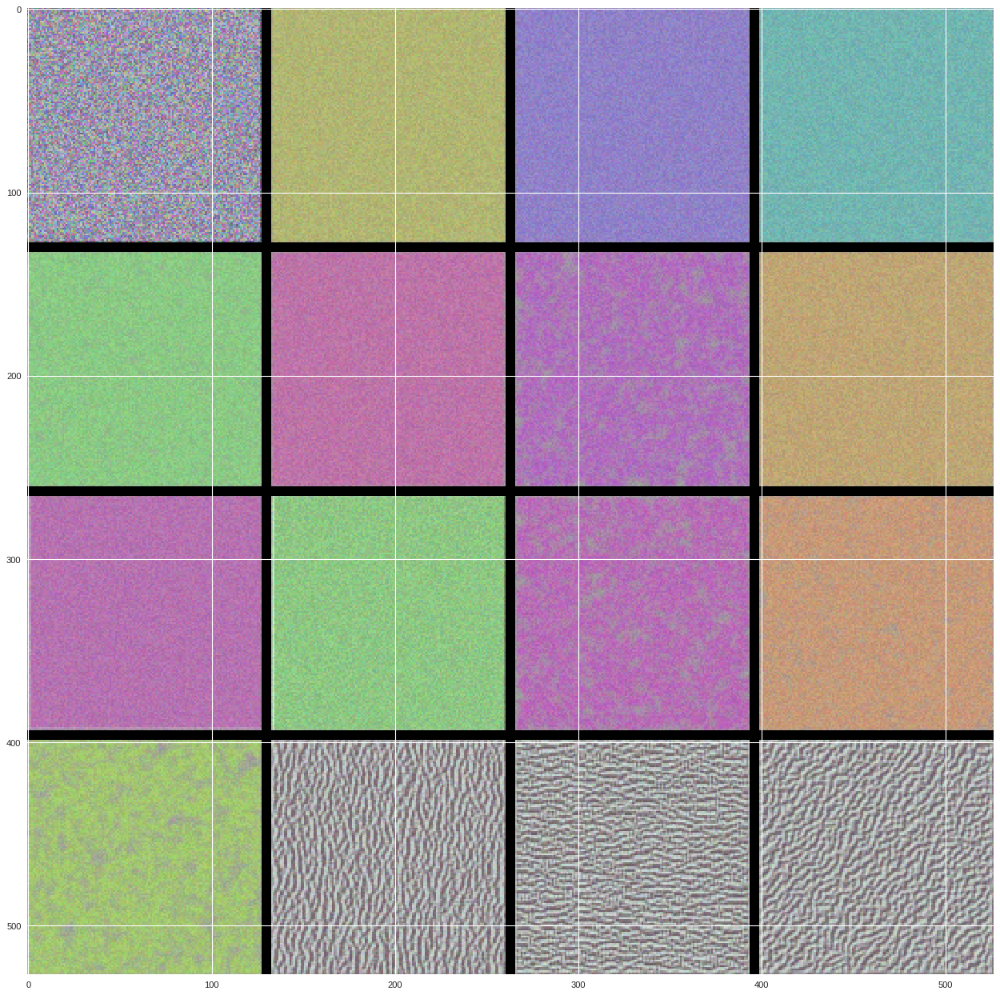

In [0]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open('stitched_filters_%dx%d.png' % (n, n))

plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img)

# block1_conv1

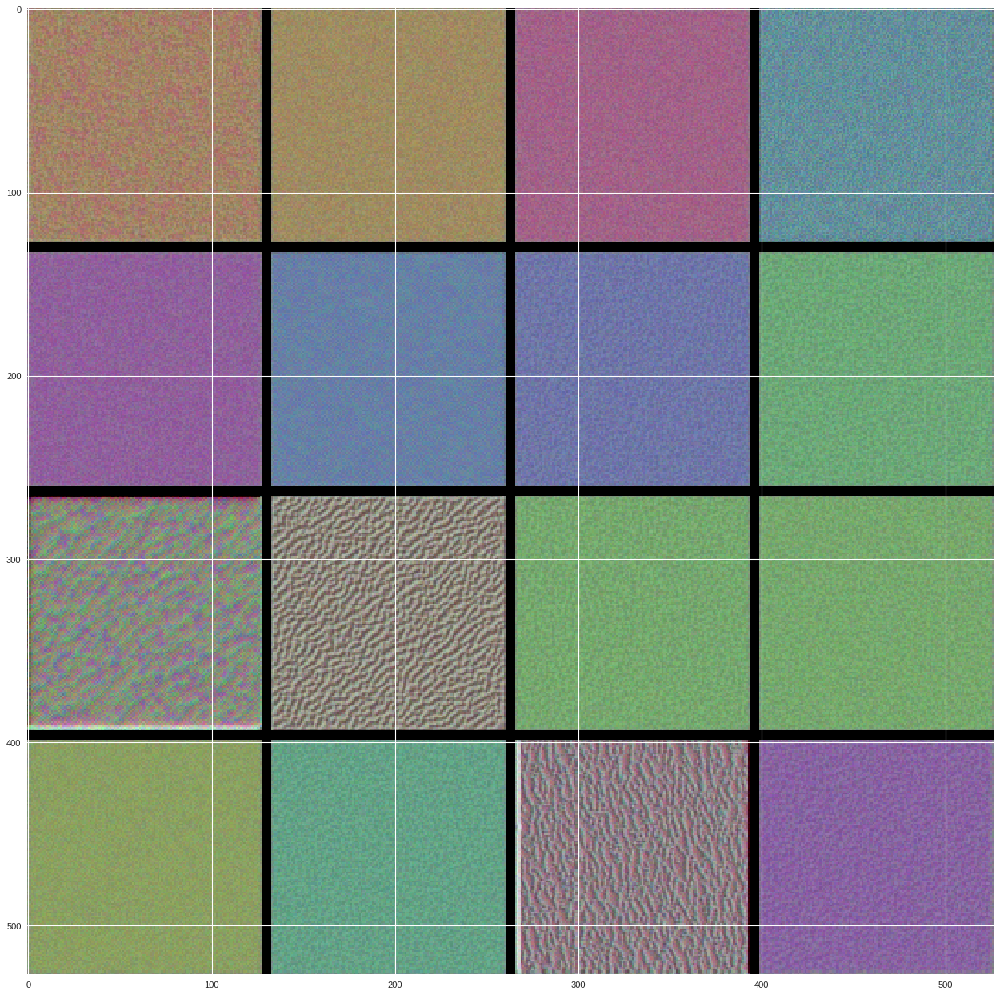

In [0]:
from PIL import Image
img = Image.open('stitched_filters_%dx%d.png' % (n, n))


plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img)

# block1_conv2

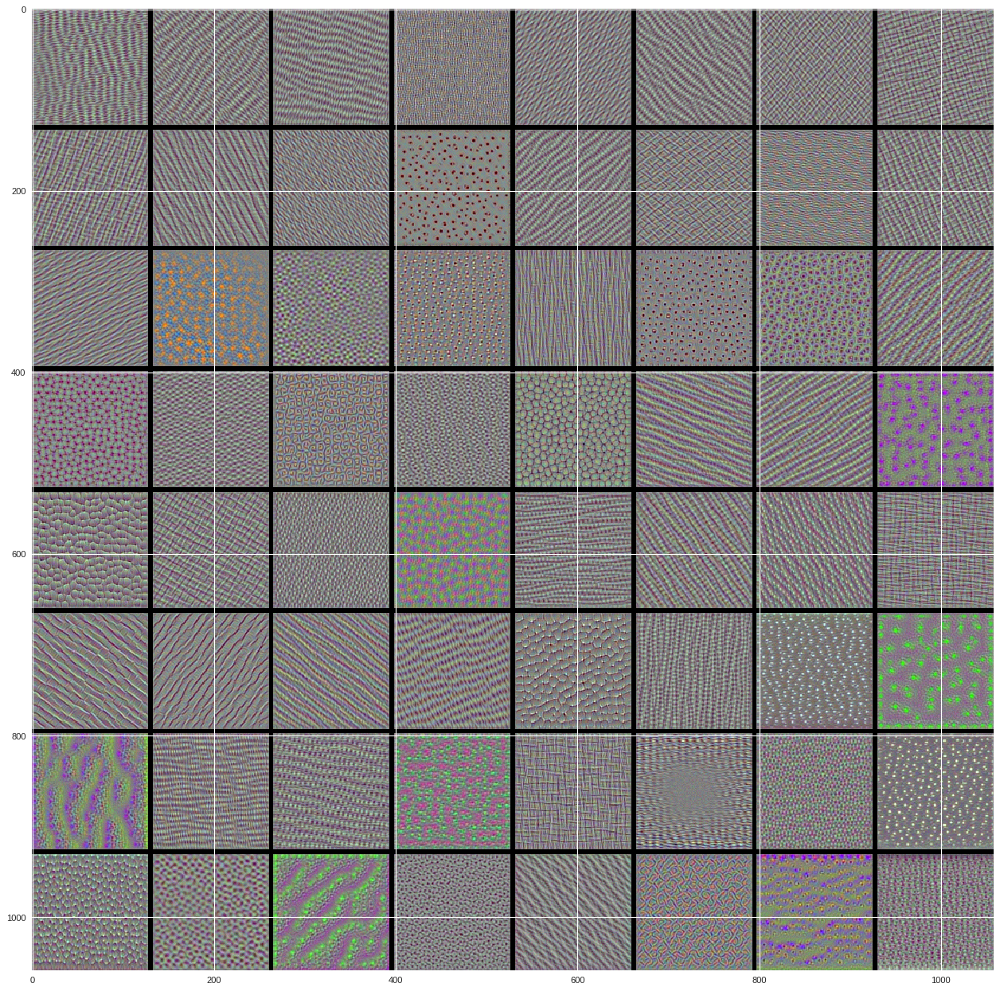

In [0]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open('stitched_filters_%dx%d.png' % (n, n))

plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img)

# block3_conv1

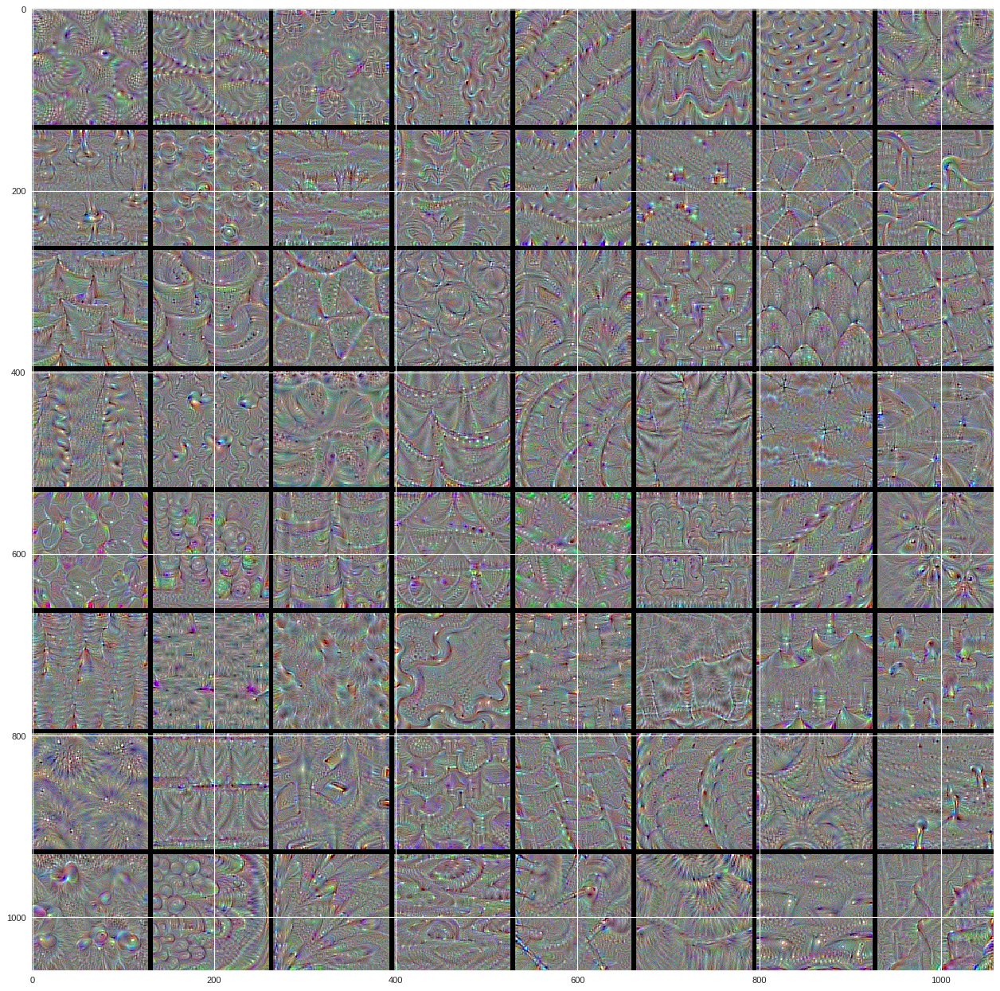

In [0]:
from PIL import Image
img = Image.open('stitched_filters_%dx%d.png' % (n, n))
# img.resize((600,400), Image.ANTIALIAS)
plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img)

# block5_conv1

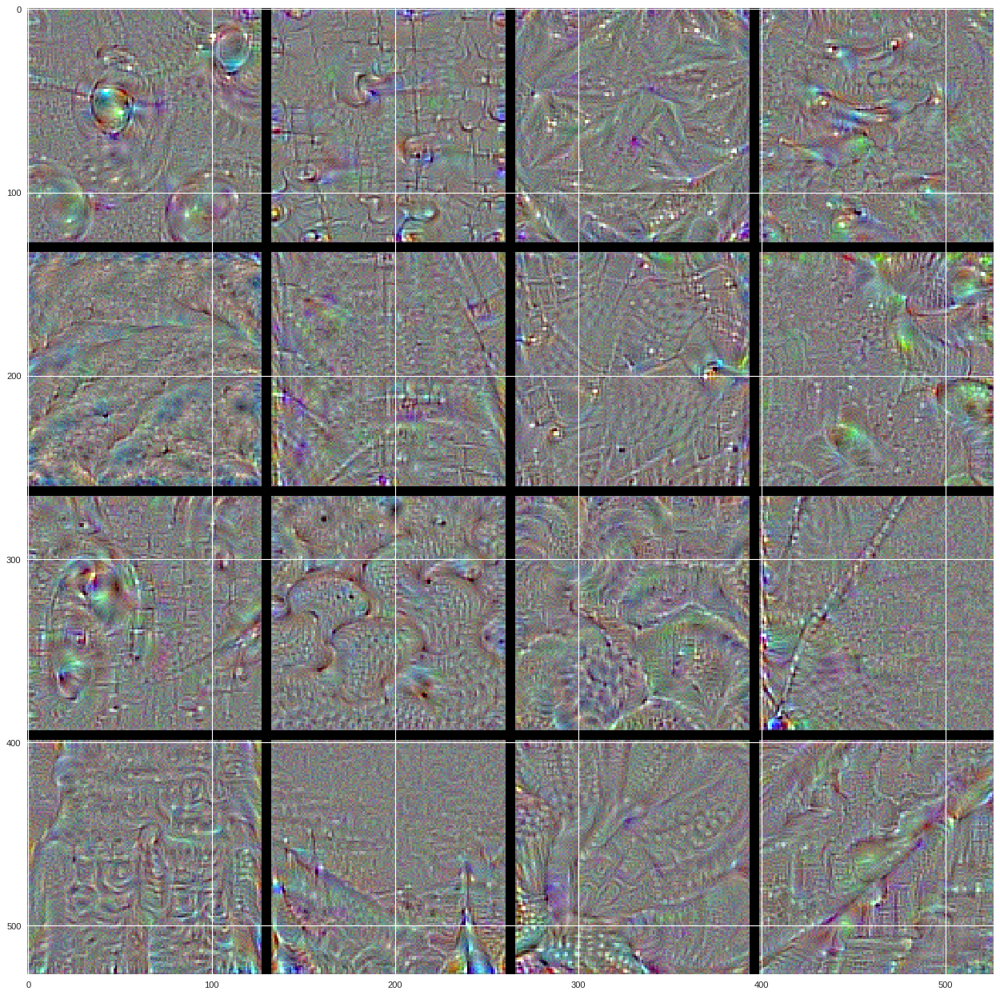

In [0]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open('stitched_filters_%dx%d.png' % (n, n))

plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img)

# block5_conv3

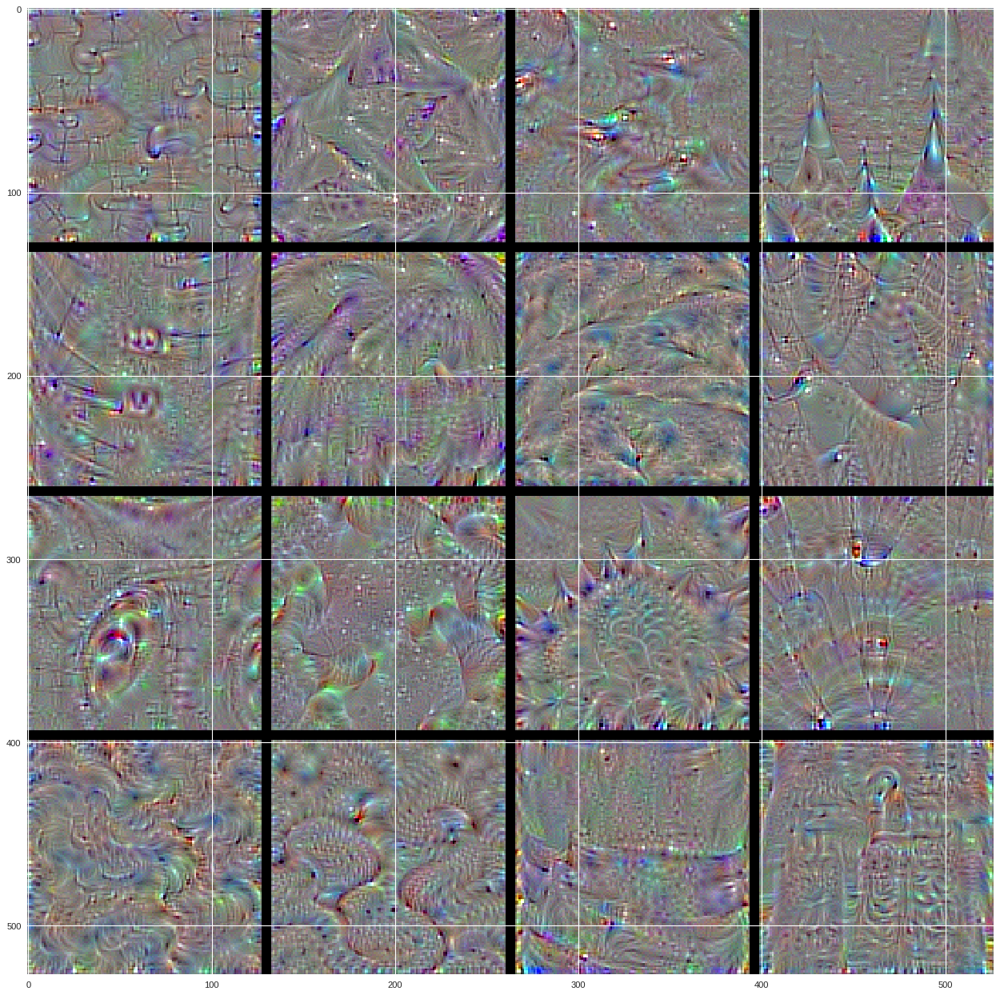

In [0]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open('stitched_filters_%dx%d.png' % (n, n))

plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img)

# block5_conv3

In [0]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  with open(fn, 'wb') as f:
    f.write(uploaded[fn])
  
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

User uploaded file "deep_dream.py" with length 6434 bytes


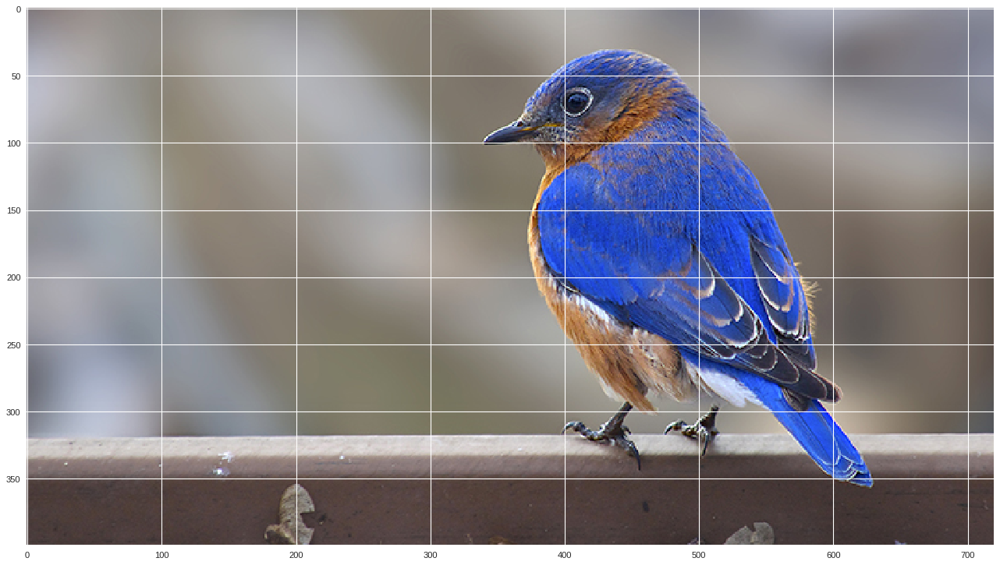

In [0]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open('eastern-bluebird.jpg')

plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img)

# block5_conv3

In [0]:
!python deep_dream.py eastern-bluebird.jpg results/dream